# INF4480 Spring of 2021 - Project 6: Adaptive Filters
### By Olav Fønstelien 2021-04-XX
<br>

### Notes:
* Implementation in Python using NumPy, SciPy, matplotlib
* You will find the filtered audio files in my GitHub repo [on this location (audio-files-filtered)](https://github.com/fonstelien/INF4480/tree/main/project6)

Before we start, let's first set up the Python environment:

In [1]:
### Setting up environment
import numpy as np
from numpy import sqrt, log10
from scipy.fft import fft
from scipy.io import wavfile
from scipy.linalg import norm, convolution_matrix as convm
import matplotlib.pyplot as plt
import IPython.display as ipd

### Importing PSD estimator functions form project 3
from project3 import periodogram, welch, multitaper, spectrogram

### Setting plotting style
plt.style.use('fivethirtyeight')
COLORS = plt.rcParams['axes.prop_cycle'].by_key()['color']

## Introduction

In this assignment we will look at two implementations of the Wiener-Hopf based adaptive filters
* the Least Mean Squares (LMS) filter -- and
* the related Normalized Least Mean Squares (NLMS) filter
We will test the filters on audio clips which are distorted by either narrowband (Assignment 1) or broadband noise (Assignment 2.1) which is uncorrelated with the wanted signal. At last we will also see how correlated noise in old audio recordings can be cancelled (Assignment 2.2).

### FIR Adaptive Filter
We want to extract the signal $d(n)$ from the observation $x(n)$ by filtering out the noise $v(n)$, where
$$
x(n) = d(n) + v(n)
$$
We do not constrain $d(n),v(n)$ to be stationary, but the stronger the autocorrelation in either one of the signals is, the better. The adaptive FIR filter has the form $\{w_n(k)\}_{k=0}^{p}$ and the  signal $d(n)$ is estimated $\hat{d}(n)$ by
$$
\hat{d}(n) = \sum_{k=0}^p w_n(k) x(n-k)
$$
The basic idea behind a noise cancelling filter is similar to that of linear prediction. We create a reference signal $x_0(n) = x(n-n_0)$ by passing $x(n)$ through a (lagging) timeshift, and optimize the filter $w_n(k)$ such that it minimizes the expected mean-square error $\mathbb{E}(|e(n)|^2)$, where
$$
e(n) = x(n) - \sum_{k=0}^p w_n(k) x_0(n-k) = d(n) + v(n) - \hat{d}(n) = \hat{v}(n)
$$
The filter $\{w_n(k)\}_{k=0}^{p}$ can then be calculated using the $n$-variant Wiener-Hopf equation
$$
\mathbf{w}_n = \mathbf{R}_{x_0}^{-1}(n) \mathbf{r}_{dx_0}(n), \quad \text{where} \quad \mathbf{R}_{x_0} \in \mathbb{C}^{(p+1) \times (p+1)}, \quad \mathbf{r}_{dx_0} \in \mathbb{C}^{(p+1)}
$$
But, $\mathbf{R}_{x_0}, \mathbf{r}_{dx_0}$ are generally unknown. Instead of approximating them, it may be more computationally efficient to search for the optimum filter weights at each time step $n$ by using the Steepest Descent method. By this method, we initialize the weights to zero;
$$
\mathbf{w}_0 = \mathbf{0}
$$
and iteratively update the weights by the rule
$$
\mathbf{w}_{n+1} = \mathbf{w}_n + \mu \hat{\mathbb{E}}[e(n) \mathbf{x}_0^*(n)]
$$
where $\mu$ is some step size, $\hat{\mathbb{E}}[\cdot]$ is the sample-mean over some $L$ samples, and $\mathbf{x}_0^*(n) = [x_0(n-0), x_0(n-1), ..., x_0(n-p)]^H$.

### LMS Filter Algorithm
The LMS filter will approximate the sample mean by using only a single sample, such that the filter weight update rule becomes
$$
\mathbf{w}_{n+1} = \mathbf{w}_n + \mu e(n) \mathbf{x}^*(n)
$$
which requires only $4p+5$ FLOPs per iteration. The algorithm for estimating the signal $d(n))$ and noise $v(n$ from the observation $x(n) = d(n) + v(n)$ at every time step $n = 0,1,...,N-1$ is as follows:

1. Initialize $\mathbf{w}_{0} = \mathbf{0}$; Then
2. $\hat{d}(n) \leftarrow \sum_{k=0}^p w_n(k) x_0(n-k)$
3. $\hat{v}(n) \leftarrow x(n) - \hat{d}(n)$
4. $\mathbf{w}_{n} \leftarrow \mathbf{w}_{n} + \mu \hat{v}(n) \mathbf{x}_0^*(n)$
5. Repeat from 2.

In [25]:
def lms(x0, x, mu, n_ord, w0=None):
    '''
    The Least Mean Squares adaptive filter. 
    Inputs are
        x0     reference signal
        x      observed signal
        mu     step size
        n_ord  filter order
    
    Returns a tuple (W, y, e), where 
        W      are the filter weights
        d      is an estimate of the correlated part of the signal; and 
        v      is an estimate of the uncorrelated part of the signal.
    '''
    
    # Set up data structures
    X = convm(x0, n_ord)
    X = X[:-n_ord+1,:]
    M, N = X.shape
    W = np.zeros(X.shape)
    if w0:
        W[0,:] = w0
    v = np.zeros(M)
    d = np.zeros(M)
    
    # Initialize
    d[0] = np.sum(W[0,:]*np.conj(X[0,:]))
    v[0] = x[0] - d[0]
    
    # Recursive calculation of filter weights W, outputs y, and errors e
    for k in range(1, M):
        W[k,:] = W[k-1,:] + mu*X[k-1,:]*v[k-1]
        d[k] = np.sum(W[k,:]*np.conj(X[k,:]))
        v[k] = x[k] - d[k]
    
    # Output gain
    d, v = d/mu, v/mu
    
    return (W, d, v)

In [3]:
def mu_max(x, n_ord):
    return 2/(n_ord+1)/x.var()

In [53]:
def nlms(x, x0, beta, n_ord, w0=None):

    # Set up data structures
    X = convm(x, n_ord)
    X = X[:-n_ord+1,:]
    M, N = X.shape
    W = np.zeros(X.shape)     
    if w0:
        W[0,:] = w0
    e = np.zeros(M)
    y = np.zeros(M)
    
    # Initialize
    y[0] = np.sum(W[0,:]*np.conj(X[0,:]))
    e[0] = x0[0] - y[0]
    
    # Recursive calculation of filter weights W, outputs y, and errors e
    for k in range(1, M):
        mu = beta/(norm(X[k-1,:])**2 + .0001)
        W[k,:] = W[k-1,:] + mu*X[k-1,:]*e[k-1]
        y[k] = np.sum(W[k,:]*np.conj(X[k,:]))
        e[k] = x0[k] - y[k]
        
    # Output gain
    y, e = y/mu, e/mu
    
    del X
    return (W, y, e)

## Assignment 1 - Removal of tone from broad band signal
### Assignment 1.1 - Audio clip

In [4]:
fnames = ('./audio-files/notch1-a.wav', './audio-files/kvinne-mann-3toner.wav', './audio-files/kvinne-mann-440-4400.wav')
fname = fnames[2]
rate, data = wavfile.read(fname)
#data = np.hstack((data, data, data))
duration = data.size/rate
ipd.Audio(fname)

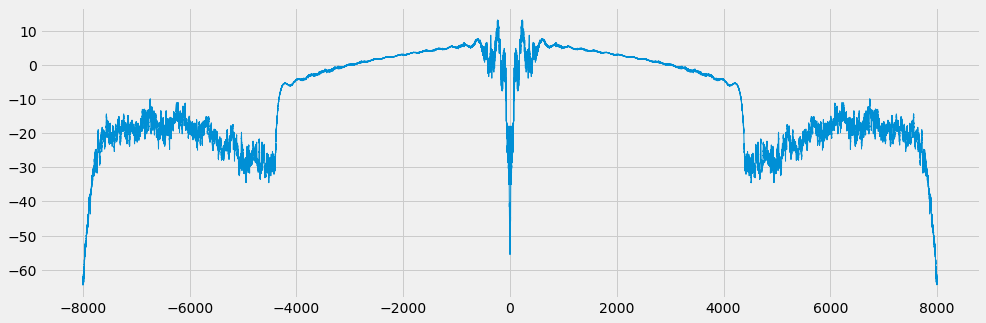

In [5]:
plt.figure(figsize=(15,5))
Pxx = multitaper(data, normalize=True, K=16)
ff = np.linspace(-rate/2, rate/2, data.size)
plt.plot(ff, 10*log10(Pxx), lw=1)

In [11]:
n0 = 10  # Reference signal delay
x = data[:-n0]
x0 = data[n0:]
n_ord = 5  # FIR filter order

In [26]:
mu = mu_max(x, n_ord)*.1
(W, y, e) = lms(x0, x, mu, n_ord)

In [9]:
(W, y, e) = nlms(x, s_ref, .05, n_ord)

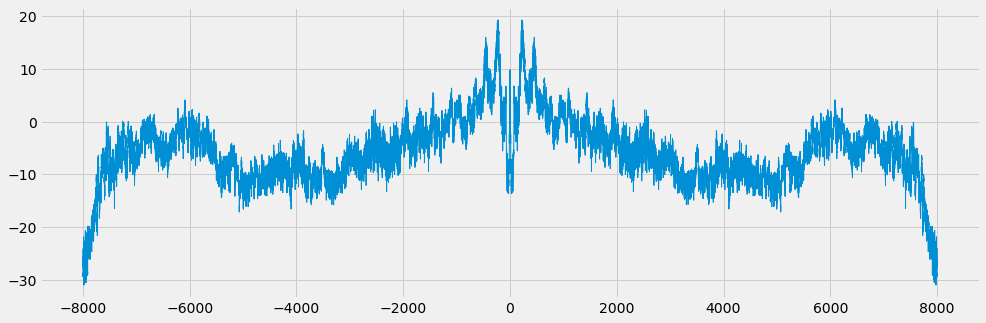

In [27]:
plt.figure(figsize=(15,5))
Pxx = multitaper(e, normalize=True, K=16)
ff = np.linspace(-rate/2, rate/2, e.size)
plt.plot(ff, 10*log10(Pxx), lw=1)

In [28]:
ipd.Audio(e, rate=rate)

In [12]:
L = 256*16
D = L//2
zero_pad = 4
sgram = spectrogram(e, L, D, normalize=True, fperiodogram=multitaper, fargs={'K':8, 'zero_pad':zero_pad})

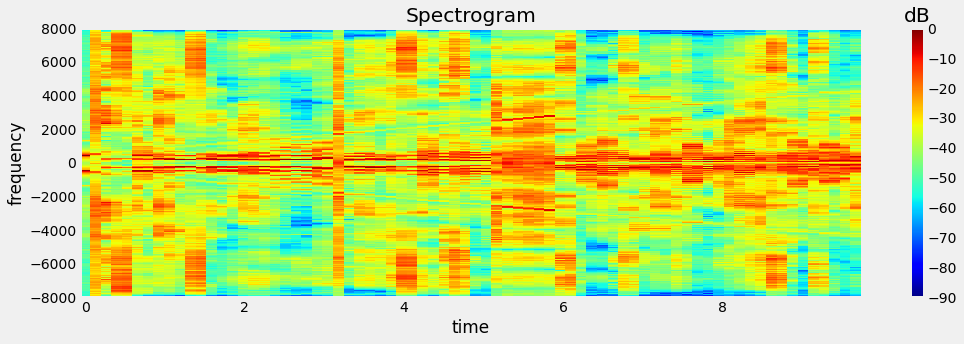

In [13]:
fig, axes = plt.subplots(ncols=1, nrows=1, sharex=True, sharey=False, figsize=(15,5))

sgram = sgram/sgram.max()

K = (len(data)-L)//D + 1
t = np.linspace(0, duration, K)
f = np.linspace(-.5*rate,.5*rate, sgram.shape[1])
tt, ff = np.meshgrid(t,f)

ax = axes
cm = ax.pcolormesh(tt, ff, 10*np.log10(sgram.T), shading='auto', cmap='jet', vmax=0, vmin=-90)
ax.set_title('Spectrogram')
cbar = plt.colorbar(cm, ax=ax)
cbar.ax.set_title('dB')
ax.set_xlabel('time')
ax.set_ylabel('frequency')

plt.tight_layout()
plt.show()

## Assignment 2 - Removal of broad band noise from broad band signal
### Assignment 2.1 - Sound clip, communications system

In [48]:
fnames = ('./audio-files/hfqrn1-a.wav', './audio-files/2mfm1-a.wav', './audio-files/vhffm1-a.wav')
fname = fnames[0]
rate, data = wavfile.read(fname)
duration = data.size/rate
out = data
for i in range(10):
    out = np.hstack((out, data))
ipd.Audio(out, rate=rate)

<ipython-input-48-a8adab1094a5>:3: WavFileWarning: Incomplete chunk ID: b'\x00', ignoring it.
  rate, data = wavfile.read(fname)
<ipython-input-48-a8adab1094a5>:3: WavFileWarning: Chunk (non-data) not understood, skipping it.
  rate, data = wavfile.read(fname)


In [49]:
n0 = 10  # Reference signal delay
x = data[:-n0]
s_ref = data[n0:]
n_ord = 25  # FIR filter order

In [50]:
mu = mu_max(x, n_ord)*.01
(W, y, e) = lms(x, s_ref, mu, n_ord)

In [40]:
(W, y, e) = nlms(x, s_ref, .25, n_ord)

In [18]:
out_filt = y
for i in range(10):
    out_filt = np.hstack((out_filt, y))
ipd.Audio(out_filt, rate=rate)

### Assignment 2.2 - Improvement of old audio recordings

In [21]:
fnames = ('./audio-files/1936-bbc-nrk-kingedwardabdication-3128-2-5sek.wav', './audio-files/nasjonalbiblioteket-folkemusikk-mzru1377-16sek.wav')
fname = fnames[1]
rate, data = wavfile.read(fname)
duration = data.size/rate
out = data
for i in range(10):
    out = np.hstack((out, data))
ipd.Audio(out, rate=rate)

<ipython-input-21-aebb2baf68e2>:3: WavFileWarning: Chunk (non-data) not understood, skipping it.
  rate, data = wavfile.read(fname)


In [42]:
n0 = 100  # Reference signal delay
x = data[:-n0]
s_ref = data[n0:]
n_ord = 2000  # FIR filter order

In [43]:
mu = mu_max(x, n_ord)*.01
(W, y, e) = lms(x, s_ref, mu, n_ord)

In [51]:
(W, y, e) = nlms(x, s_ref, .01, n_ord)

In [ ]:
out_filt = y
for i in range(10):
    out_filt = np.hstack((out_filt, y))
ipd.Audio(out_filt, rate=rate)